<a href="https://www.kaggle.com/code/babaksh/anime-face-image-gan-tensorflow?scriptVersionId=242917484" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Anime Face Generator using GANs
A comprehensive implementation of a Generative Adversarial Network (GAN) 
to generate high-quality anime face images using TensorFlow and Keras.

This notebook demonstrates the complete pipeline from data preprocessing 
to model training and evaluation on the Anime Face Dataset.

## Project Overview
This notebook implements a **Generative Adversarial Network (GAN)** to generate realistic anime face images. 
GANs consist of two neural networks competing against each other:

- **Generator**: Creates fake images from random noise
- **Discriminator**: Distinguishes between real and fake images

Through this adversarial training process, the generator learns to create increasingly realistic anime faces.

## Dataset
We'll be using the **Anime Face Dataset** containing 63,632 high-quality anime face images from Kaggle.


## Key Features
- Data preprocessing and augmentation
- Custom GAN architecture optimized for face generation
- Progressive training with visualization
- Real-time monitoring of generated samples
- Model checkpointing and evaluation metrics

Let's begin our journey into the world of AI-generated anime art! 🚀


## Import Required Libraries

We'll start by importing all necessary libraries for our GAN implementation:

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import cv2
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Deep Learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import BinaryCrossentropy
from tensorflow.keras.utils import plot_model

2025-05-31 14:43:43.893063: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748702624.077139      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748702624.133026      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Set random seeds for reproducibility
np.random.seed(42)
tf.random.set_seed(42)

In [3]:
# Configuration
IMG_SIZE = 64
BATCH_SIZE = 64
BUFFER_SIZE = 10000
EPOCHS = 70
NOISE_DIM = 100
num_examples_to_generate = 16
GENERATOR_LR = 0.00005
DISCRIMINATOR_LR = 0.00002

In [4]:
# Configure GPU if available
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print(f"GPU Available: {tf.config.experimental.get_device_details(physical_devices[0])}")
else:
    print("Training on CPU")

print(f"TensorFlow Version: {tf.__version__}")
print(f"Keras Version: {keras.__version__}")

GPU Available: {'compute_capability': (6, 0), 'device_name': 'Tesla P100-PCIE-16GB'}
TensorFlow Version: 2.18.0
Keras Version: 3.8.0


## Dataset Exploration and Analysis

Let's explore our anime face dataset to understand its structure and characteristics.
This analysis will help us make informed decisions about preprocessing and model architecture.


In [5]:
# Dataset path (Kaggle environment)
DATASET_PATH = "/kaggle/input/animefacedataset"
if not os.path.exists(DATASET_PATH):
    DATASET_PATH = "/kaggle/input/animefacedataset/images"
if not os.path.exists(DATASET_PATH):
    DATASET_PATH = "/kaggle/input/animefacedataset/data"

In [6]:
# Find the correct path
for root, dirs, files in os.walk("/kaggle/input/animefacedataset"):
    if len(files) > 1000:  # Assuming we have many image files
        DATASET_PATH = root
        break

print(f"Dataset path: {DATASET_PATH}")

Dataset path: /kaggle/input/animefacedataset/images


In [7]:
# Get list of image files
image_files = []
valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp')

for file in os.listdir(DATASET_PATH):
    if file.lower().endswith(valid_extensions):
        image_files.append(file)

print(f"Total number of images: {len(image_files)}")
print(f"Sample filenames: {image_files[:5]}")

Total number of images: 63565
Sample filenames: ['35715_2011.jpg', '48610_2014.jpg', '34719_2011.jpg', '40266_2012.jpg', '4199_2002.jpg']


## Dataset Visualization

Let's visualize some sample images from our dataset to understand the variety and quality of anime faces we're working with.


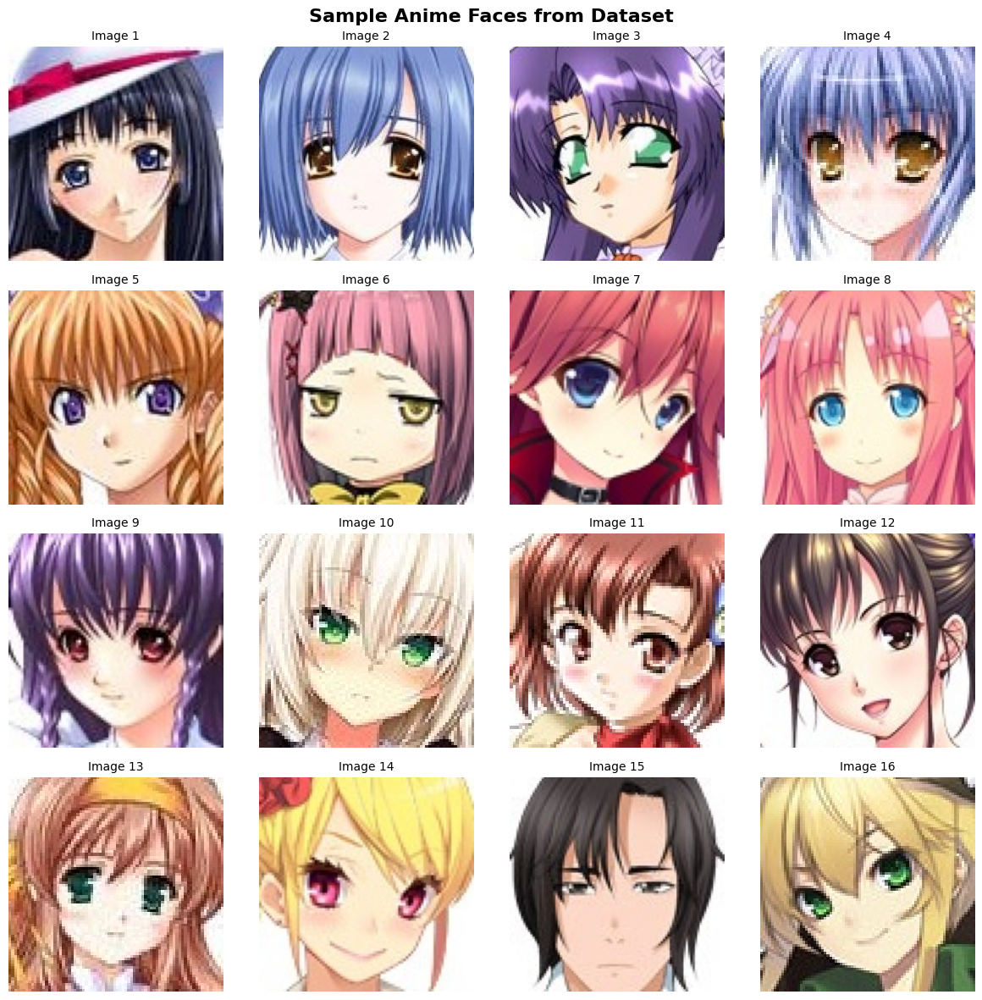

In [8]:
def display_sample_images(image_files, dataset_path, num_samples=16):
    """Display a grid of sample images from the dataset"""
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    fig.suptitle('Sample Anime Faces from Dataset', fontsize=16, fontweight='bold')
    
    sample_files = np.random.choice(image_files, num_samples, replace=False)
    
    for i, ax in enumerate(axes.flat):
        if i < len(sample_files):
            img_path = os.path.join(dataset_path, sample_files[i])
            try:
                img = Image.open(img_path)
                ax.imshow(img)
                ax.set_title(f'Image {i+1}', fontsize=10)
            except Exception as e:
                ax.text(0.5, 0.5, 'Error loading image', ha='center', va='center')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display sample images
display_sample_images(image_files, DATASET_PATH)

## Image Properties Analysis

Let's analyze the dimensions, color distribution, and other properties of our images to inform our preprocessing pipeline.


In [9]:
def analyze_images(image_files, dataset_path, sample_size=1000):
    """Analyze image properties from a sample of the dataset"""
    sample_files = np.random.choice(image_files, min(sample_size, len(image_files)), replace=False)
    
    widths, heights, channels = [], [], []
    file_sizes = []
    
    print("Analyzing image properties...")
    for filename in tqdm(sample_files[:100]):  # Analyze first 100 for speed
        try:
            img_path = os.path.join(dataset_path, filename)
            img = Image.open(img_path)
            width, height = img.size
            
            widths.append(width)
            heights.append(height)
            channels.append(len(img.getbands()))
            file_sizes.append(os.path.getsize(img_path))
            
        except Exception as e:
            continue
    
    return {
        'widths': widths,
        'heights': heights,
        'channels': channels,
        'file_sizes': file_sizes
    }

Analyzing image properties...


100%|██████████| 100/100 [00:00<00:00, 271.99it/s]


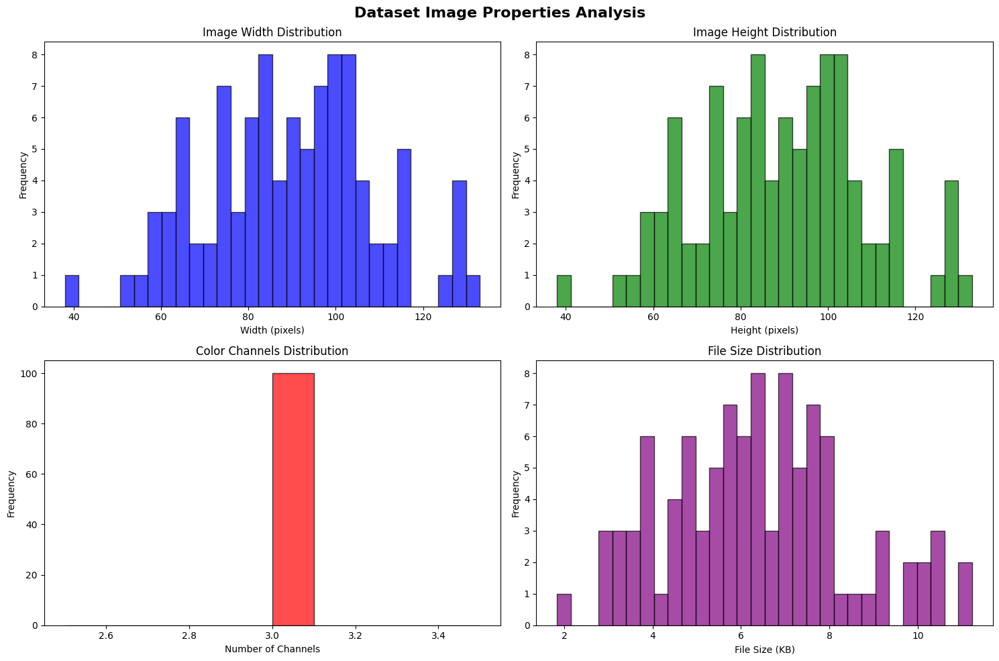

In [10]:
# Analyze images
image_stats = analyze_images(image_files, DATASET_PATH)

# Create visualization of image properties
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Dataset Image Properties Analysis', fontsize=16, fontweight='bold')

# Width distribution
axes[0, 0].hist(image_stats['widths'], bins=30, alpha=0.7, color='blue', edgecolor='black')
axes[0, 0].set_title('Image Width Distribution')
axes[0, 0].set_xlabel('Width (pixels)')
axes[0, 0].set_ylabel('Frequency')

# Height distribution
axes[0, 1].hist(image_stats['heights'], bins=30, alpha=0.7, color='green', edgecolor='black')
axes[0, 1].set_title('Image Height Distribution')
axes[0, 1].set_xlabel('Height (pixels)')
axes[0, 1].set_ylabel('Frequency')

# Channels distribution
axes[1, 0].hist(image_stats['channels'], bins=10, alpha=0.7, color='red', edgecolor='black')
axes[1, 0].set_title('Color Channels Distribution')
axes[1, 0].set_xlabel('Number of Channels')
axes[1, 0].set_ylabel('Frequency')

# File sizes distribution
axes[1, 1].hist([size/1024 for size in image_stats['file_sizes']], bins=30, alpha=0.7, color='purple', edgecolor='black')
axes[1, 1].set_title('File Size Distribution')
axes[1, 1].set_xlabel('File Size (KB)')
axes[1, 1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()

In [11]:
# Print statistics
print(f"Image Statistics:")
print(f"Average Width: {np.mean(image_stats['widths']):.1f} ± {np.std(image_stats['widths']):.1f}")
print(f"Average Height: {np.mean(image_stats['heights']):.1f} ± {np.std(image_stats['heights']):.1f}")
print(f"Most common channels: {max(set(image_stats['channels']), key=image_stats['channels'].count)}")
print(f"Average file size: {np.mean(image_stats['file_sizes'])/1024:.1f} KB")


Image Statistics:
Average Width: 89.3 ± 19.2
Average Height: 89.3 ± 19.2
Most common channels: 3
Average file size: 6.4 KB


## Data Preprocessing Pipeline

Now we'll create a robust preprocessing pipeline to prepare our images for GAN training:

1. **Resize** images to a consistent size (64x64 pixels)
2. **Normalize** pixel values to [-1, 1] range
3. **Create batches** for efficient training
4. **Apply data augmentation** to increase dataset diversity



In [12]:
def preprocess_image(image_path):
    """Preprocess a single image"""
    try:
        # Read image
        image = tf.io.read_file(image_path)
        image = tf.image.decode_image(image, channels=3, expand_animations=False)
        
        # Convert to float and resize
        image = tf.cast(image, tf.float32)
        image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
        
        # Normalize to [-1, 1]
        image = (image / 127.5) - 1.0
        
        return image
    except:
        # Return a black image if there's an error
        return tf.zeros([IMG_SIZE, IMG_SIZE, 3], dtype=tf.float32)


In [13]:
def create_dataset(image_files, dataset_path, batch_size=BATCH_SIZE):
    """Create a TensorFlow dataset from image files"""
    # Create list of full paths
    image_paths = [os.path.join(dataset_path, f) for f in image_files]
    
    # Create dataset
    dataset = tf.data.Dataset.from_tensor_slices(image_paths)
    dataset = dataset.map(preprocess_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.filter(lambda x: tf.reduce_sum(tf.abs(x)) > 0)  # Remove black images
    dataset = dataset.shuffle(BUFFER_SIZE)
    dataset = dataset.batch(batch_size, drop_remainder=True)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

In [14]:
# Create the dataset
print("Creating dataset...")
train_dataset = create_dataset(image_files, DATASET_PATH)

# Get dataset info
dataset_size = 0
for batch in train_dataset:
    dataset_size += batch.shape[0]

print(f"Dataset created successfully!")
print(f"Total training samples: {dataset_size}")
print(f"Batches per epoch: {dataset_size // BATCH_SIZE}")
print(f"Image shape: {(IMG_SIZE, IMG_SIZE, 3)}")
print(f"Batch size: {BATCH_SIZE}")

Creating dataset...


I0000 00:00:1748702712.606843      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Dataset created successfully!
Total training samples: 63552
Batches per epoch: 993
Image shape: (64, 64, 3)
Batch size: 64


## Visualizing Preprocessed Data

Let's verify our preprocessing pipeline by visualizing some processed images to ensure they look correct.

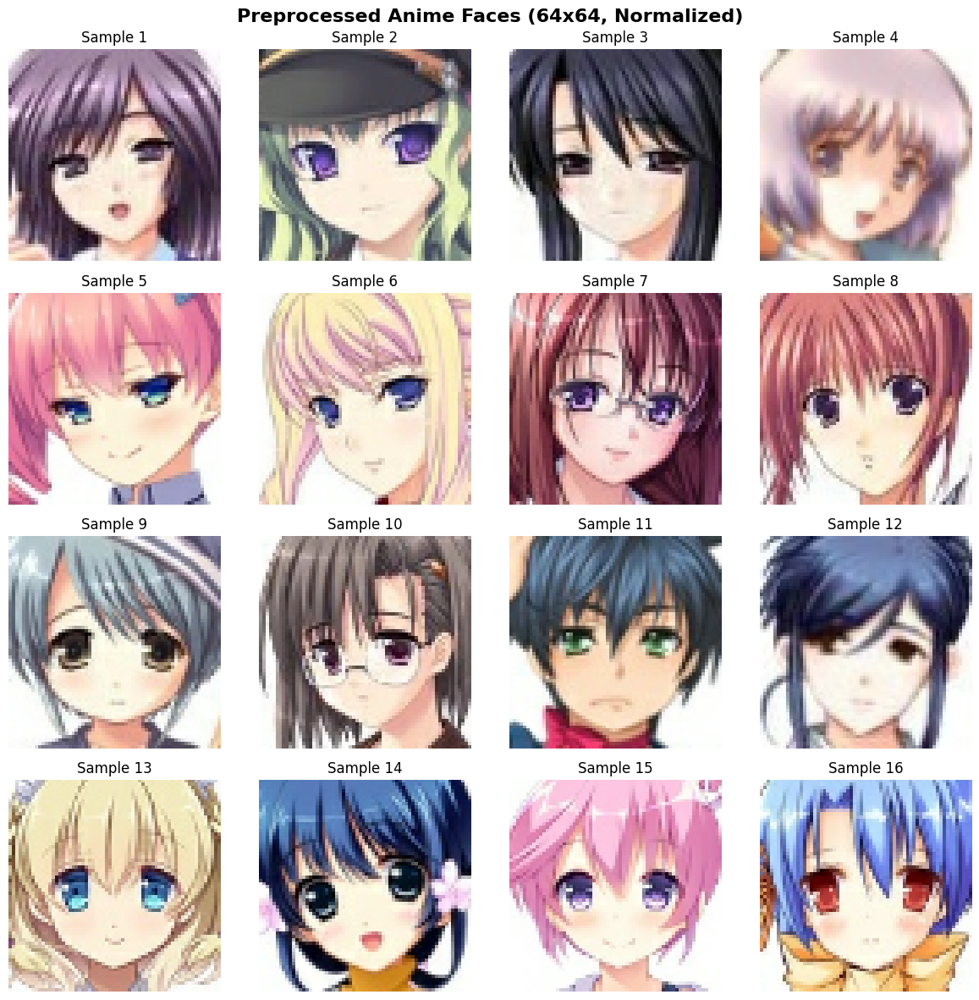

In [15]:
def show_preprocessed_batch(dataset, num_images=16):
    """Display a batch of preprocessed images"""
    for batch in dataset.take(1):
        fig, axes = plt.subplots(4, 4, figsize=(12, 12))
        fig.suptitle('Preprocessed Anime Faces (64x64, Normalized)', fontsize=16, fontweight='bold')
        
        for i, ax in enumerate(axes.flat):
            if i < num_images:
                # Denormalize for display
                img = (batch[i] + 1.0) / 2.0
                img = tf.clip_by_value(img, 0.0, 1.0)
                ax.imshow(img)
                ax.set_title(f'Sample {i+1}')
            ax.axis('off')
        
        plt.tight_layout()
        plt.show()
        break

show_preprocessed_batch(train_dataset)

## GAN Architecture: Generator Network

The Generator network transforms random noise into realistic anime faces. Our architecture uses:

- **Transpose Convolutions** for upsampling
- **Batch Normalization** for stable training
- **LeakyReLU** activations for better gradient flow
- **Progressive upsampling** from 4x4 to 64x64

The generator starts with a 100-dimensional noise vector and progressively upsamples to create 64x64x3 images.


In [16]:
def make_generator(noise_dim=100):
    model = tf.keras.Sequential([
        # Foundation: 4x4x1024 - Start with more capacity
        layers.Dense(4 * 4 * 1024, use_bias=False, input_shape=(noise_dim,)),
        layers.BatchNormalization(),
        layers.ReLU(),
        layers.Reshape((4, 4, 1024)),
        
        # Upsample to 8x8x512
        layers.Conv2DTranspose(512, (4, 4), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        # Upsample to 16x16x256
        layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        # Upsample to 32x32x128
        layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.ReLU(),
        
        # Final layer: 64x64x3
        layers.Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', use_bias=False, activation='tanh')
    ], name='Generator')
    
    return model

In [17]:
# Create generator
generator = make_generator()

# Display model architecture
print("Generator Architecture:")
generator.summary()

# Test generator with random noise
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
print(f"Generated image shape: {generated_image.shape}")

Generator Architecture:


Model: "Generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 16384)               │       1,638,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 16384)               │          65,536 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu (ReLU)                         │ (None, 16384)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 4, 4, 1024)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 8, 8, 512)           │       8,388,608 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 8, 8, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_1 (ReLU)                       │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 16, 16, 256)         │       2,097,152 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 16, 16, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_2 (ReLU)                       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 32, 32, 128)         │         524,288 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 32, 32, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ re_lu_3 (ReLU)                       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           6,144 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 12,723,712 (48.54 MB)

 Trainable params: 12,689,152 (48.41 MB)

 Non-trainable params: 34,560 (135.00 KB)

I0000 00:00:1748702793.867312      19 cuda_dnn.cc:529] Loaded cuDNN version 90300


Generated image shape: (1, 64, 64, 3)


## GAN Architecture: Discriminator Network

The Discriminator acts as a binary classifier, distinguishing real anime faces from generated ones. Key features:

- **Convolutional layers** for feature extraction
- **Leaky ReLU** activations to prevent dying neurons
- **Dropout** for regularization
- **No batch normalization** (common practice in discriminators)
- **Binary output** (real vs fake probability)


In [18]:
def make_discriminator():
    model = tf.keras.Sequential([
        # Input: 64x64x3
        layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=[64, 64, 3]),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # 32x32x128
        layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # 16x16x256
        layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # 8x8x512
        layers.Conv2D(512, (4, 4), strides=(2, 2), padding='same'),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # Flatten and classify
        layers.Flatten(),
        layers.Dense(1) 
    ], name='Discriminator')
    
    return model

In [19]:
# Create discriminator
discriminator = make_discriminator()

# Display model architecture
print("Discriminator Architecture:")
discriminator.summary()

# Test discriminator
decision = discriminator(generated_image)
print(f"Discriminator decision shape: {decision.shape}")
print(f"Decision (0=fake, 1=real): {decision.numpy()}")

Discriminator Architecture:


Model: "Discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           3,136 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         524,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 8, 8, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 4, 4, 512)           │       2,097,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 4, 4, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │           8,193 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,768,321 (10.56 MB)

 Trainable params: 2,766,529 (10.55 MB)

 Non-trainable params: 1,792 (7.00 KB)

Discriminator decision shape: (1, 1)
Decision (0=fake, 1=real): [[-0.00033122]]


## Loss Functions and Optimizers

We'll use Binary Cross-Entropy loss for both networks:

- **Generator Loss**: Wants discriminator to classify fake images as real
- **Discriminator Loss**: Wants to correctly classify real vs fake images

We use separate Adam optimizers with different learning rates for stability.


In [20]:
# Loss function
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=False)

def discriminator_loss(real_output, fake_output, label_smoothing=0.1):
    """Calculate discriminator loss"""
    real_loss = tf.keras.losses.binary_crossentropy(
        tf.ones_like(real_output) * (1 - label_smoothing), 
        real_output, 
        from_logits=True
    )
    fake_loss = tf.keras.losses.binary_crossentropy(
        tf.zeros_like(fake_output), 
        fake_output, 
        from_logits=True
    )
    total_loss = tf.reduce_mean(real_loss) + tf.reduce_mean(fake_loss)
    return total_loss

def generator_loss(fake_output):
    """Calculate generator loss"""
    return tf.reduce_mean(tf.keras.losses.binary_crossentropy(
        tf.ones_like(fake_output), 
        fake_output, 
        from_logits=True
    ))

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=GENERATOR_LR, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=DISCRIMINATOR_LR, beta_1=0.5)

print("Loss functions and optimizers configured!")
print(f"Generator optimizer: {generator_optimizer.__class__.__name__}")
print(f"Discriminator optimizer: {discriminator_optimizer.__class__.__name__}")


Loss functions and optimizers configured!
Generator optimizer: Adam
Discriminator optimizer: Adam


## Training Setup and Checkpoints

We'll set up checkpointing to save our model progress and enable resuming training if needed.


In [21]:
# Checkpoint setup
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(
    generator_optimizer=generator_optimizer,
    discriminator_optimizer=discriminator_optimizer,
    generator=generator,
    discriminator=discriminator
)

In [22]:
# Create fixed noise for consistent visualization
seed = tf.random.normal([num_examples_to_generate, NOISE_DIM])

print("Training setup complete!")
print(f"Epochs: {EPOCHS}")
print(f"Noise dimension: {NOISE_DIM}")
print(f"Checkpoint directory: {checkpoint_dir}")

Training setup complete!
Epochs: 70
Noise dimension: 100
Checkpoint directory: ./training_checkpoints


## Training Functions

Here we define the core training functions that will be executed for each batch:

1. **train_step**: Performs one training iteration
2. **generate_and_save_images**: Creates and displays generated samples
3. **Training loop**: Orchestrates the entire training process


In [23]:
@tf.function
def train_step(images):
    """Perform one training step"""
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss

In [24]:
@tf.function
def train_optional(images, batch_size, noise_dim, train_discriminator=True):
    """Perform one training step with optional discriminator training control"""
    noise = tf.random.normal([batch_size, noise_dim])
    
    # Train Generator
    with tf.GradientTape() as gen_tape:
        generated_images = generator(noise, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    
    # Train Discriminator (with optional control)
    disc_loss = 0
    if train_discriminator:
        with tf.GradientTape() as disc_tape:
            # Generate new images for discriminator training
            noise = tf.random.normal([batch_size, noise_dim])
            generated_images = generator(noise, training=True)
            
            real_output = discriminator(images, training=True)
            fake_output = discriminator(generated_images, training=True)
            
            disc_loss = discriminator_loss(real_output, fake_output)
        
        gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
        discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss

In [25]:
def generate_and_save_images(model, epoch, test_input):
    """Generate and display images during training"""
    predictions = model(test_input, training=False)
    
    fig = plt.figure(figsize=(8, 8))
    fig.suptitle(f'Generated Images - Epoch {epoch}', fontsize=16, fontweight='bold')
    
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        # Denormalize image for display
        img = (predictions[i] + 1) / 2.0
        img = tf.clip_by_value(img, 0.0, 1.0)
        plt.imshow(img)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

## Main Training Loop

Now we'll start the main training process! The GAN will train for the specified number of epochs, 
and we'll visualize the progress by generating sample images at regular intervals.

**What to expect:**
- Initial images will look like noise
- Gradually, face-like structures will emerge
- After several epochs, you should see recognizable anime faces
- Training time depends on your hardware (GPU recommended)

In [26]:
def train(dataset, epochs):
    """Main training function"""
    gen_losses = []
    disc_losses = []
    
    print("Starting GAN training...")
    print("=" * 50)
    
    for epoch in range(epochs):
        epoch_gen_loss = []
        epoch_disc_loss = []
        
        # Training progress bar
        progress_bar = tqdm(dataset, desc=f'Epoch {epoch+1}/{epochs}')
        
        for image_batch in progress_bar:
            gen_loss, disc_loss = train_step(image_batch)
            epoch_gen_loss.append(gen_loss)
            epoch_disc_loss.append(disc_loss)
            
            # Update progress bar with current losses
            progress_bar.set_postfix({
                'Gen Loss': f'{gen_loss:.4f}',
                'Disc Loss': f'{disc_loss:.4f}'
            })
        
        # Calculate average losses for the epoch
        avg_gen_loss = tf.reduce_mean(epoch_gen_loss)
        avg_disc_loss = tf.reduce_mean(epoch_disc_loss)
        gen_losses.append(avg_gen_loss)
        disc_losses.append(avg_disc_loss)
        
        # Generate and display images every 5 epochs
        if (epoch + 1) % 5 == 0:
            generate_and_save_images(generator, epoch + 1, seed)
            
        # Save checkpoint every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            print(f'Checkpoint saved at epoch {epoch + 1}')
        
        print(f'Epoch {epoch + 1}: Gen Loss = {avg_gen_loss:.4f}, Disc Loss = {avg_disc_loss:.4f}')
        print("-" * 50)
    
    return gen_losses, disc_losses

In [27]:
def train_improved(dataset, epochs, batch_size, noise_dim):
    """Improved training function with adaptive training"""
    
    gen_losses = []
    disc_losses = []
    
    print("Starting improved GAN training...")
    print("=" * 50)
    
    for epoch in range(epochs):
        epoch_gen_loss = []
        epoch_disc_loss = []
        
        progress_bar = tqdm(dataset, desc=f'Epoch {epoch+1}/{epochs}')
        
        for batch_idx, image_batch in enumerate(progress_bar):
            # Adaptive training
            train_disc = True
            if len(epoch_disc_loss) > 10:  # After some batches
                recent_disc_loss = tf.reduce_mean(epoch_disc_loss[-10:])
                recent_gen_loss = tf.reduce_mean(epoch_gen_loss[-10:])
                
                # If discriminator is too strong (low loss), skip some training steps
                if recent_disc_loss < 0.3 and recent_gen_loss > 2.0:
                    train_disc = (batch_idx % 3 != 0)  # Train discriminator only 2/3 of the time
            
            gen_loss, disc_loss = train_optional(image_batch, batch_size, noise_dim, train_disc)
            
            epoch_gen_loss.append(gen_loss)
            if train_disc:
                epoch_disc_loss.append(disc_loss)
            
            progress_bar.set_postfix({
                'Gen Loss': f'{gen_loss:.4f}',
                'Disc Loss': f'{disc_loss:.4f}' if train_disc else 'Skipped',
                'Train Disc': train_disc
            })
        
        # Calculate average losses
        avg_gen_loss = tf.reduce_mean(epoch_gen_loss)
        avg_disc_loss = tf.reduce_mean(epoch_disc_loss) if epoch_disc_loss else 0
        gen_losses.append(avg_gen_loss)
        disc_losses.append(avg_disc_loss)

        # Generate and display images every 5 epochs
        if (epoch + 1) % 5 == 0:
            generate_and_save_images(generator, epoch + 1, seed)

        # Save checkpoint every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)
            print(f'Checkpoint saved at epoch {epoch + 1}')
        
        print(f'Epoch {epoch + 1}: Gen Loss = {avg_gen_loss:.4f}, Disc Loss = {avg_disc_loss:.4f}')
        print("-" * 50)
    
    return gen_losses, disc_losses

Starting Anime Face GAN Training!
Training with 63552 images for 70 epochs
Grab some coffee ☕ - this might take a while!
Starting improved GAN training...


Epoch 1/70: 0it [00:00, ?it/s]E0000 00:00:1748702808.054355      19 meta_optimizer.cc:966] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inDiscriminator_3/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
Epoch 1/70: 993it [01:53,  8.75it/s, Gen Loss=1.4261, Disc Loss=1.5591, Train Disc=1]


Epoch 1: Gen Loss = 1.3195, Disc Loss = 1.5171
--------------------------------------------------


Epoch 2/70: 993it [01:41,  9.79it/s, Gen Loss=1.0163, Disc Loss=1.5242, Train Disc=1]


Epoch 2: Gen Loss = 1.0776, Disc Loss = 1.4749
--------------------------------------------------


Epoch 3/70: 993it [01:41,  9.81it/s, Gen Loss=0.8927, Disc Loss=1.4120, Train Disc=1]


Epoch 3: Gen Loss = 0.9854, Disc Loss = 1.4724
--------------------------------------------------


Epoch 4/70: 993it [01:41,  9.77it/s, Gen Loss=0.7915, Disc Loss=1.4917, Train Disc=1]


Epoch 4: Gen Loss = 0.9116, Disc Loss = 1.4807
--------------------------------------------------


Epoch 5/70: 993it [01:41,  9.75it/s, Gen Loss=0.8311, Disc Loss=1.4283, Train Disc=1]


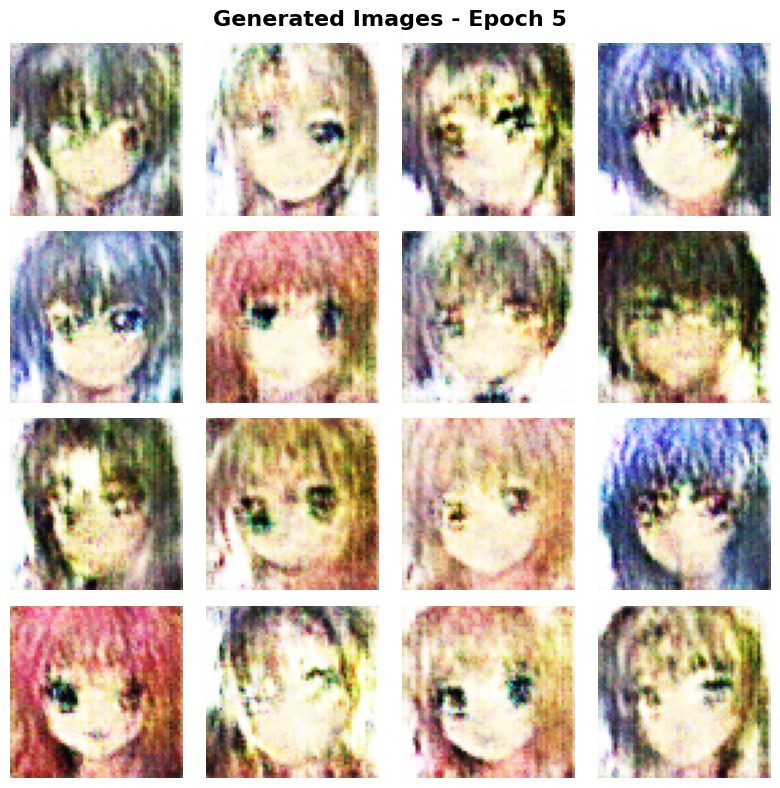

Epoch 5: Gen Loss = 0.8596, Disc Loss = 1.4715
--------------------------------------------------


Epoch 6/70: 993it [01:41,  9.82it/s, Gen Loss=0.8689, Disc Loss=1.4500, Train Disc=1]


Epoch 6: Gen Loss = 0.8399, Disc Loss = 1.4588
--------------------------------------------------


Epoch 7/70: 993it [01:41,  9.79it/s, Gen Loss=0.7973, Disc Loss=1.4121, Train Disc=1]


Epoch 7: Gen Loss = 0.8251, Disc Loss = 1.4466
--------------------------------------------------


Epoch 8/70: 993it [01:41,  9.77it/s, Gen Loss=0.8194, Disc Loss=1.4362, Train Disc=1]


Epoch 8: Gen Loss = 0.8254, Disc Loss = 1.4360
--------------------------------------------------


Epoch 9/70: 993it [01:40,  9.84it/s, Gen Loss=0.7947, Disc Loss=1.4192, Train Disc=1]


Epoch 9: Gen Loss = 0.8212, Disc Loss = 1.4267
--------------------------------------------------


Epoch 10/70: 993it [01:41,  9.81it/s, Gen Loss=0.7882, Disc Loss=1.4048, Train Disc=1]


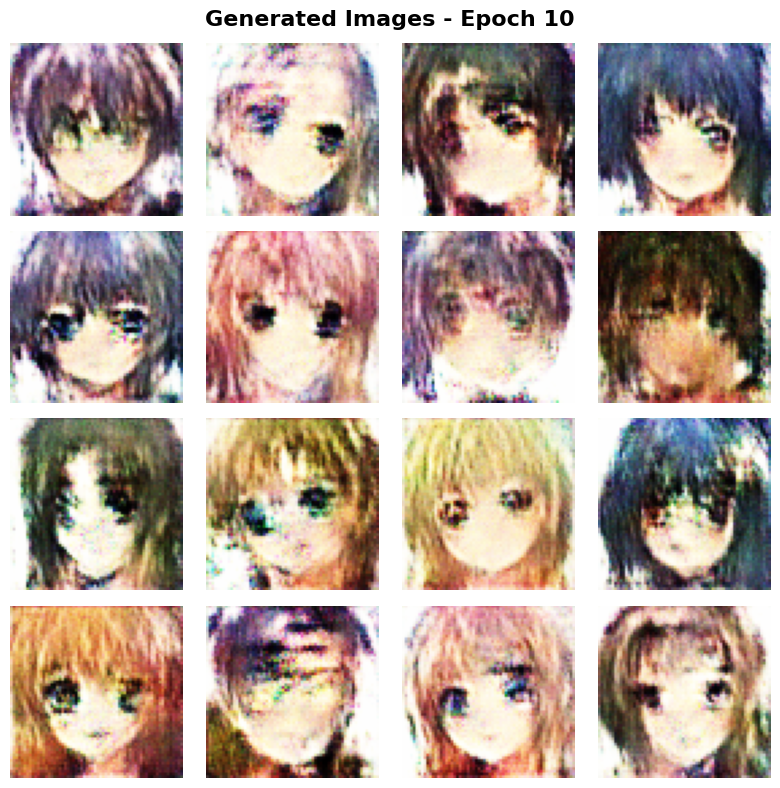

Checkpoint saved at epoch 10
Epoch 10: Gen Loss = 0.8225, Disc Loss = 1.4148
--------------------------------------------------


Epoch 11/70: 993it [01:41,  9.75it/s, Gen Loss=0.8082, Disc Loss=1.4300, Train Disc=1]


Epoch 11: Gen Loss = 0.8245, Disc Loss = 1.4034
--------------------------------------------------


Epoch 12/70: 993it [01:40,  9.85it/s, Gen Loss=0.8479, Disc Loss=1.4008, Train Disc=1]


Epoch 12: Gen Loss = 0.8265, Disc Loss = 1.3995
--------------------------------------------------


Epoch 13/70: 993it [01:40,  9.85it/s, Gen Loss=0.8406, Disc Loss=1.4212, Train Disc=1]


Epoch 13: Gen Loss = 0.8220, Disc Loss = 1.3978
--------------------------------------------------


Epoch 14/70: 993it [01:41,  9.79it/s, Gen Loss=0.8518, Disc Loss=1.4121, Train Disc=1]


Epoch 14: Gen Loss = 0.8201, Disc Loss = 1.3959
--------------------------------------------------


Epoch 15/70: 993it [01:41,  9.79it/s, Gen Loss=0.8114, Disc Loss=1.3767, Train Disc=1]


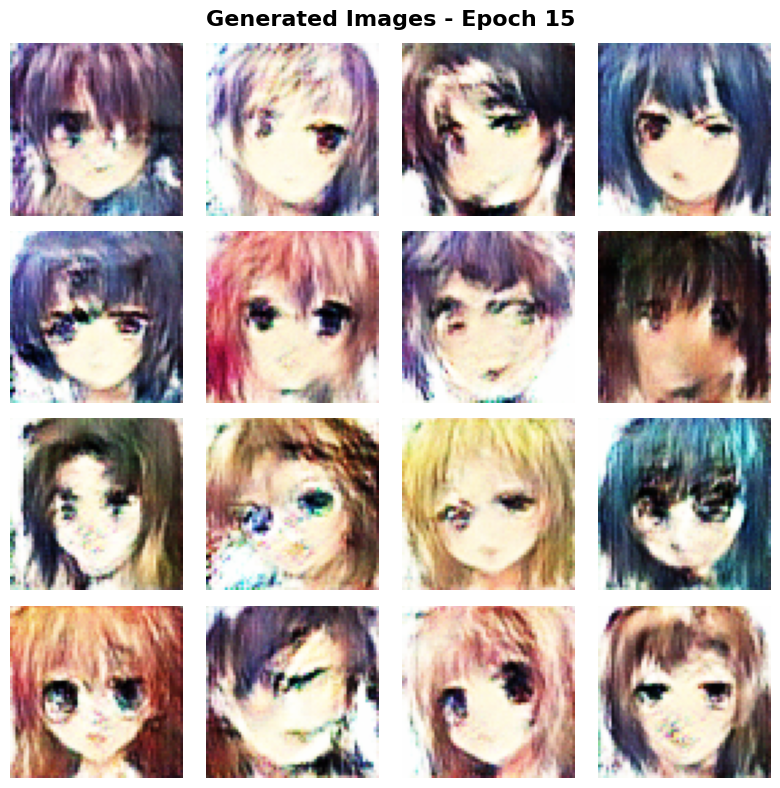

Epoch 15: Gen Loss = 0.8187, Disc Loss = 1.3922
--------------------------------------------------


Epoch 16/70: 993it [01:41,  9.82it/s, Gen Loss=0.8650, Disc Loss=1.3774, Train Disc=1]


Epoch 16: Gen Loss = 0.8196, Disc Loss = 1.3889
--------------------------------------------------


Epoch 17/70: 993it [01:42,  9.74it/s, Gen Loss=0.7987, Disc Loss=1.4297, Train Disc=1]


Epoch 17: Gen Loss = 0.8197, Disc Loss = 1.3870
--------------------------------------------------


Epoch 18/70: 993it [01:41,  9.76it/s, Gen Loss=0.8200, Disc Loss=1.3556, Train Disc=1]


Epoch 18: Gen Loss = 0.8207, Disc Loss = 1.3836
--------------------------------------------------


Epoch 19/70: 993it [01:41,  9.77it/s, Gen Loss=0.8507, Disc Loss=1.3710, Train Disc=1]


Epoch 19: Gen Loss = 0.8201, Disc Loss = 1.3828
--------------------------------------------------


Epoch 20/70: 993it [01:40,  9.83it/s, Gen Loss=0.8517, Disc Loss=1.3755, Train Disc=1]


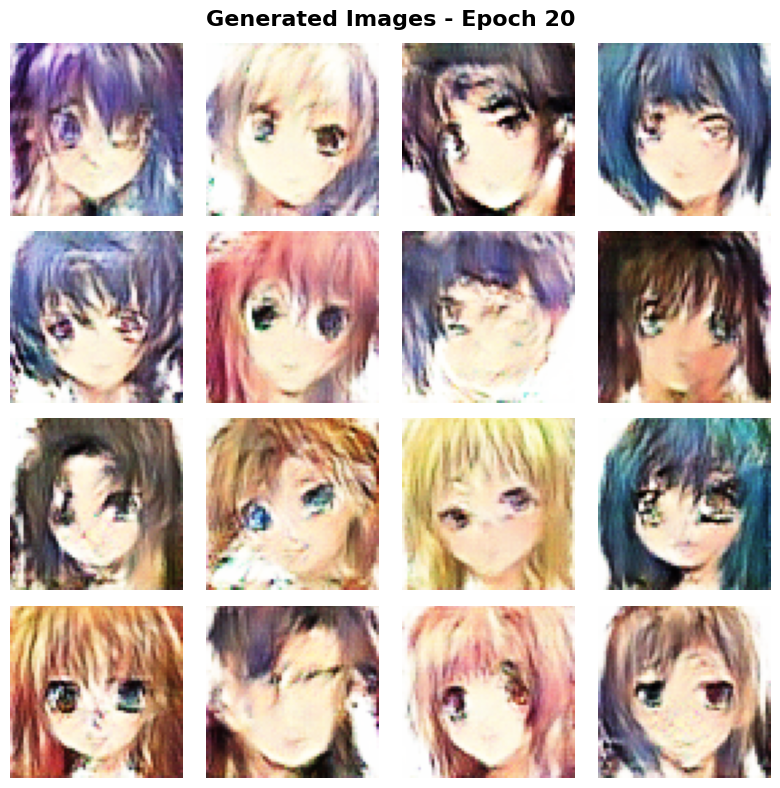

Checkpoint saved at epoch 20
Epoch 20: Gen Loss = 0.8212, Disc Loss = 1.3805
--------------------------------------------------


Epoch 21/70: 993it [01:41,  9.76it/s, Gen Loss=0.7940, Disc Loss=1.3913, Train Disc=1]


Epoch 21: Gen Loss = 0.8218, Disc Loss = 1.3781
--------------------------------------------------


Epoch 22/70: 993it [01:40,  9.85it/s, Gen Loss=0.7940, Disc Loss=1.3876, Train Disc=1]


Epoch 22: Gen Loss = 0.8231, Disc Loss = 1.3770
--------------------------------------------------


Epoch 23/70: 993it [01:41,  9.79it/s, Gen Loss=0.8508, Disc Loss=1.3593, Train Disc=1]


Epoch 23: Gen Loss = 0.8242, Disc Loss = 1.3738
--------------------------------------------------


Epoch 24/70: 993it [01:41,  9.80it/s, Gen Loss=0.8255, Disc Loss=1.3939, Train Disc=1]


Epoch 24: Gen Loss = 0.8254, Disc Loss = 1.3715
--------------------------------------------------


Epoch 25/70: 993it [01:41,  9.80it/s, Gen Loss=0.8405, Disc Loss=1.3970, Train Disc=1]


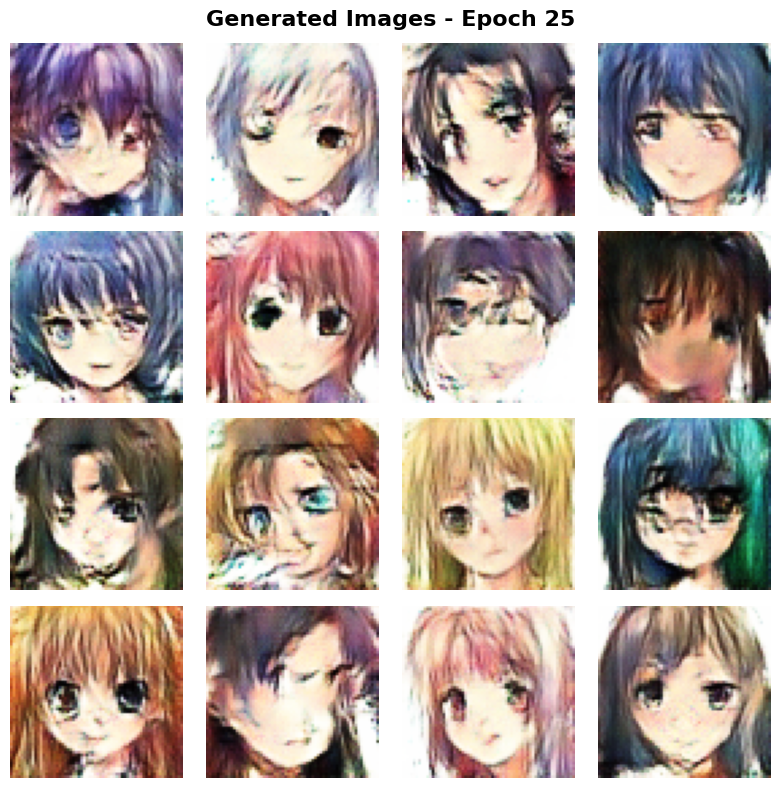

Epoch 25: Gen Loss = 0.8295, Disc Loss = 1.3688
--------------------------------------------------


Epoch 26/70: 993it [01:41,  9.82it/s, Gen Loss=0.8675, Disc Loss=1.3780, Train Disc=1]


Epoch 26: Gen Loss = 0.8312, Disc Loss = 1.3666
--------------------------------------------------


Epoch 27/70: 993it [01:41,  9.83it/s, Gen Loss=0.8135, Disc Loss=1.3583, Train Disc=1]


Epoch 27: Gen Loss = 0.8327, Disc Loss = 1.3629
--------------------------------------------------


Epoch 28/70: 993it [01:41,  9.75it/s, Gen Loss=0.8666, Disc Loss=1.3695, Train Disc=1]


Epoch 28: Gen Loss = 0.8364, Disc Loss = 1.3597
--------------------------------------------------


Epoch 29/70: 993it [01:41,  9.81it/s, Gen Loss=0.8004, Disc Loss=1.3516, Train Disc=1]


Epoch 29: Gen Loss = 0.8386, Disc Loss = 1.3596
--------------------------------------------------


Epoch 30/70: 993it [01:41,  9.78it/s, Gen Loss=0.8524, Disc Loss=1.3621, Train Disc=1]


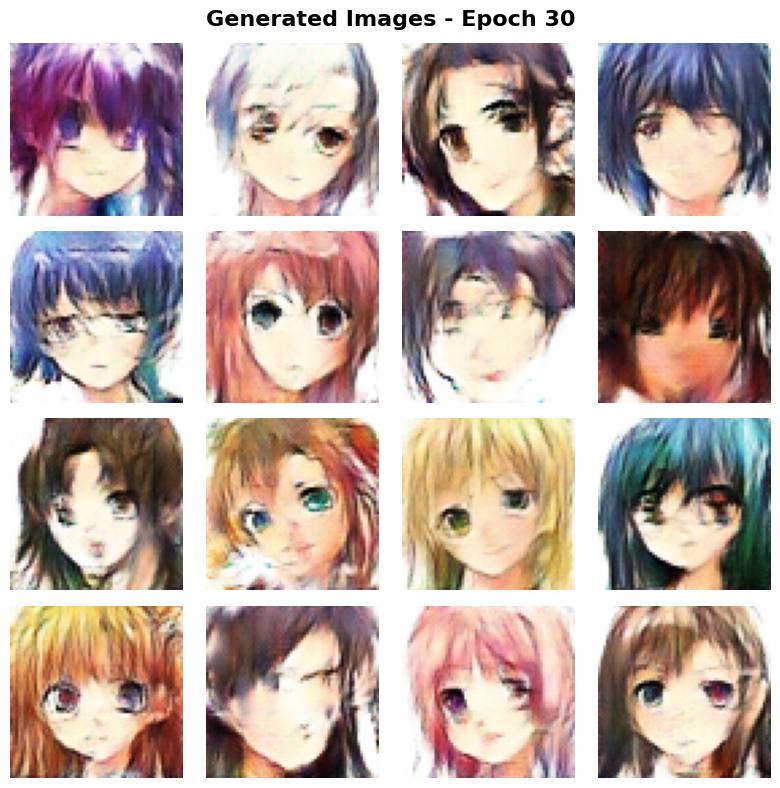

Checkpoint saved at epoch 30
Epoch 30: Gen Loss = 0.8440, Disc Loss = 1.3543
--------------------------------------------------


Epoch 31/70: 993it [01:41,  9.75it/s, Gen Loss=0.8111, Disc Loss=1.3105, Train Disc=1]


Epoch 31: Gen Loss = 0.8485, Disc Loss = 1.3512
--------------------------------------------------


Epoch 32/70: 993it [01:42,  9.73it/s, Gen Loss=0.8735, Disc Loss=1.3753, Train Disc=1]


Epoch 32: Gen Loss = 0.8528, Disc Loss = 1.3454
--------------------------------------------------


Epoch 33/70: 993it [01:41,  9.77it/s, Gen Loss=0.9037, Disc Loss=1.3255, Train Disc=1]


Epoch 33: Gen Loss = 0.8593, Disc Loss = 1.3398
--------------------------------------------------


Epoch 34/70: 993it [01:41,  9.75it/s, Gen Loss=0.9294, Disc Loss=1.3360, Train Disc=1]


Epoch 34: Gen Loss = 0.8655, Disc Loss = 1.3352
--------------------------------------------------


Epoch 35/70: 993it [01:41,  9.79it/s, Gen Loss=0.8911, Disc Loss=1.3226, Train Disc=1]


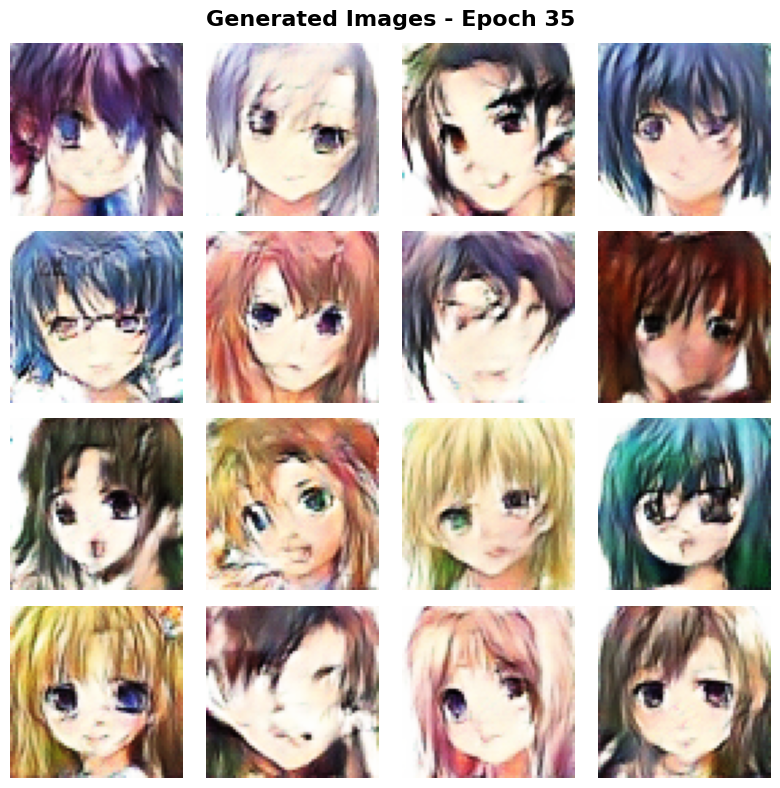

Epoch 35: Gen Loss = 0.8741, Disc Loss = 1.3289
--------------------------------------------------


Epoch 36/70: 993it [01:41,  9.77it/s, Gen Loss=0.8630, Disc Loss=1.3034, Train Disc=1]


Epoch 36: Gen Loss = 0.8835, Disc Loss = 1.3234
--------------------------------------------------


Epoch 37/70: 993it [01:41,  9.80it/s, Gen Loss=0.8945, Disc Loss=1.2845, Train Disc=1]


Epoch 37: Gen Loss = 0.8927, Disc Loss = 1.3137
--------------------------------------------------


Epoch 38/70: 993it [01:41,  9.79it/s, Gen Loss=0.9375, Disc Loss=1.2343, Train Disc=1]


Epoch 38: Gen Loss = 0.9018, Disc Loss = 1.3066
--------------------------------------------------


Epoch 39/70: 993it [01:40,  9.85it/s, Gen Loss=0.9256, Disc Loss=1.2317, Train Disc=1]


Epoch 39: Gen Loss = 0.9137, Disc Loss = 1.3011
--------------------------------------------------


Epoch 40/70: 993it [01:42,  9.73it/s, Gen Loss=0.9659, Disc Loss=1.2774, Train Disc=1]


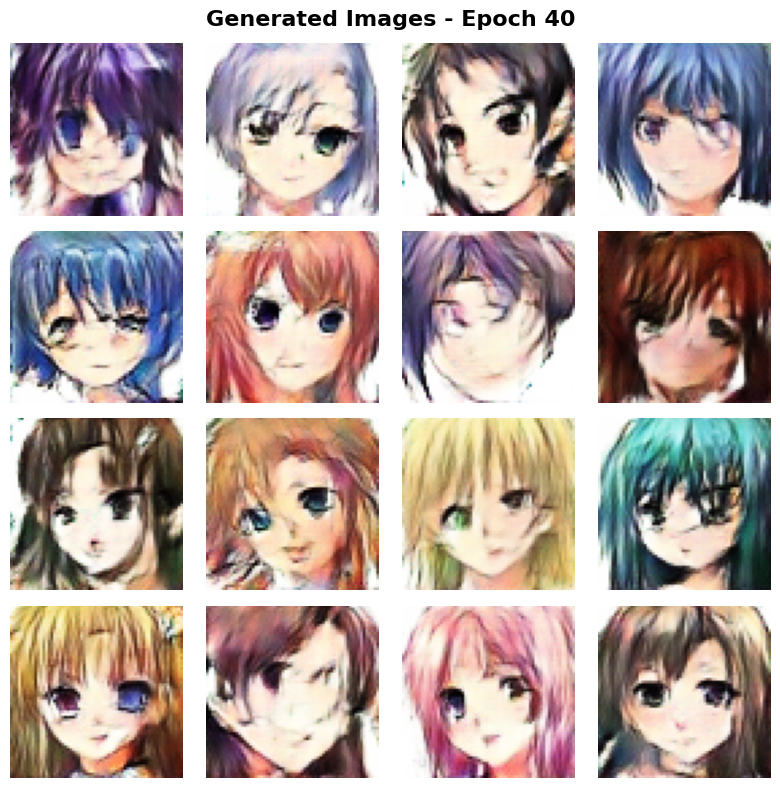

Checkpoint saved at epoch 40
Epoch 40: Gen Loss = 0.9267, Disc Loss = 1.2923
--------------------------------------------------


Epoch 41/70: 993it [01:42,  9.73it/s, Gen Loss=0.9712, Disc Loss=1.1867, Train Disc=1]


Epoch 41: Gen Loss = 0.9395, Disc Loss = 1.2853
--------------------------------------------------


Epoch 42/70: 993it [01:41,  9.83it/s, Gen Loss=1.0909, Disc Loss=1.2650, Train Disc=1]


Epoch 42: Gen Loss = 0.9504, Disc Loss = 1.2712
--------------------------------------------------


Epoch 43/70: 993it [01:41,  9.83it/s, Gen Loss=0.7840, Disc Loss=1.2398, Train Disc=1]


Epoch 43: Gen Loss = 0.9659, Disc Loss = 1.2623
--------------------------------------------------


Epoch 44/70: 993it [01:41,  9.79it/s, Gen Loss=0.8779, Disc Loss=1.2043, Train Disc=1]


Epoch 44: Gen Loss = 0.9771, Disc Loss = 1.2536
--------------------------------------------------


Epoch 45/70: 993it [01:41,  9.83it/s, Gen Loss=1.0427, Disc Loss=1.2613, Train Disc=1]


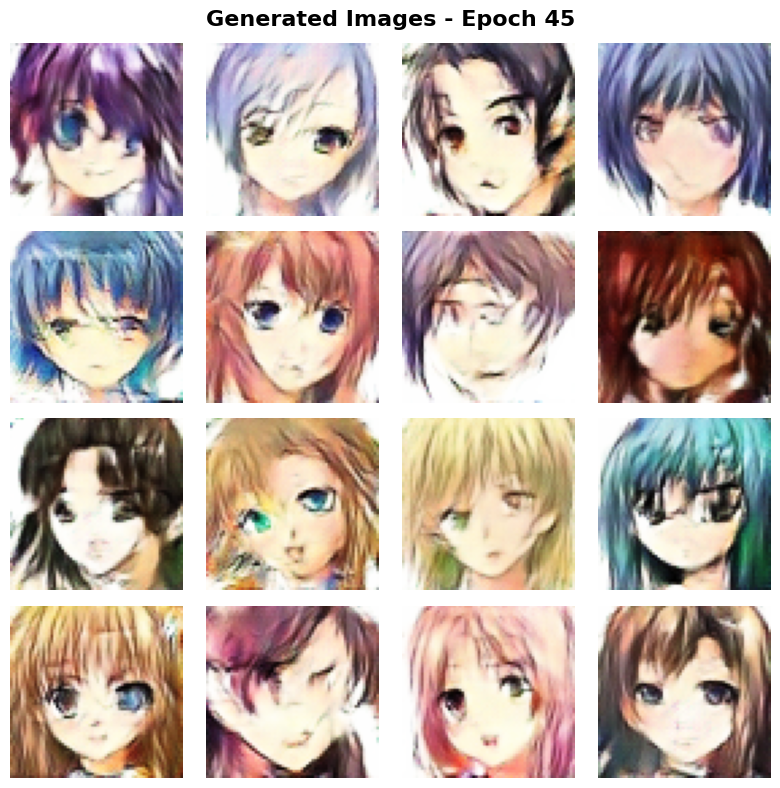

Epoch 45: Gen Loss = 0.9951, Disc Loss = 1.2429
--------------------------------------------------


Epoch 46/70: 993it [01:41,  9.81it/s, Gen Loss=0.9976, Disc Loss=1.2285, Train Disc=1]


Epoch 46: Gen Loss = 1.0055, Disc Loss = 1.2356
--------------------------------------------------


Epoch 47/70: 993it [01:41,  9.76it/s, Gen Loss=1.1496, Disc Loss=1.2784, Train Disc=1]


Epoch 47: Gen Loss = 1.0250, Disc Loss = 1.2238
--------------------------------------------------


Epoch 48/70: 993it [01:41,  9.82it/s, Gen Loss=1.0174, Disc Loss=1.2712, Train Disc=1]


Epoch 48: Gen Loss = 1.0456, Disc Loss = 1.2130
--------------------------------------------------


Epoch 49/70: 993it [01:40,  9.85it/s, Gen Loss=1.1678, Disc Loss=1.2932, Train Disc=1]


Epoch 49: Gen Loss = 1.0617, Disc Loss = 1.2013
--------------------------------------------------


Epoch 50/70: 993it [01:41,  9.80it/s, Gen Loss=1.2092, Disc Loss=1.1669, Train Disc=1]


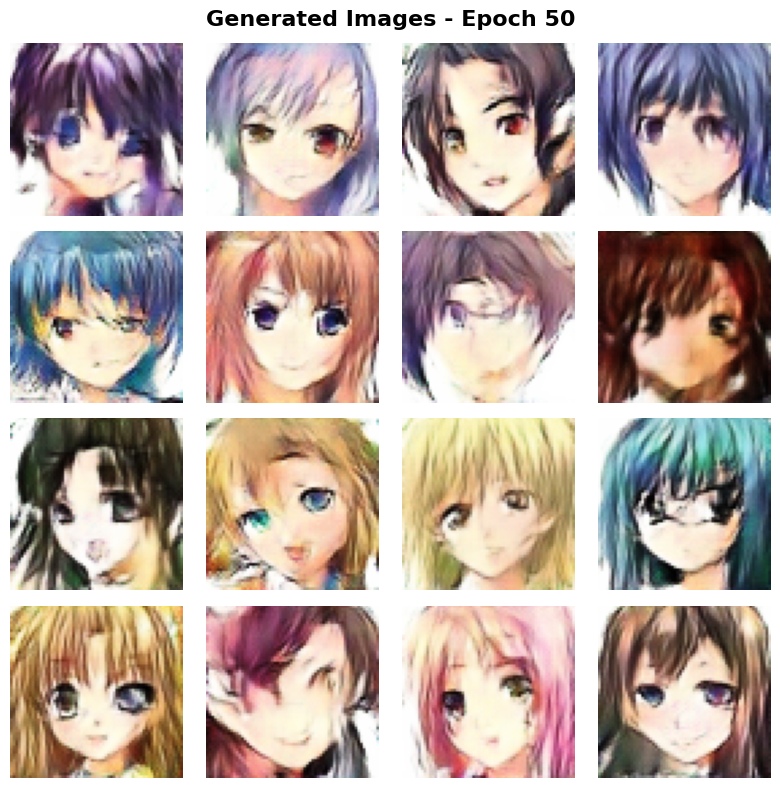

Checkpoint saved at epoch 50
Epoch 50: Gen Loss = 1.0757, Disc Loss = 1.1938
--------------------------------------------------


Epoch 51/70: 993it [01:40,  9.84it/s, Gen Loss=1.1035, Disc Loss=1.2079, Train Disc=1]


Epoch 51: Gen Loss = 1.1007, Disc Loss = 1.1796
--------------------------------------------------


Epoch 52/70: 993it [01:41,  9.83it/s, Gen Loss=1.5546, Disc Loss=1.2046, Train Disc=1]


Epoch 52: Gen Loss = 1.1195, Disc Loss = 1.1712
--------------------------------------------------


Epoch 53/70: 993it [01:41,  9.82it/s, Gen Loss=0.8221, Disc Loss=1.0071, Train Disc=1]


Epoch 53: Gen Loss = 1.1345, Disc Loss = 1.1563
--------------------------------------------------


Epoch 54/70: 993it [01:41,  9.75it/s, Gen Loss=1.0475, Disc Loss=1.0215, Train Disc=1]


Epoch 54: Gen Loss = 1.1592, Disc Loss = 1.1456
--------------------------------------------------


Epoch 55/70: 993it [01:41,  9.82it/s, Gen Loss=1.2974, Disc Loss=1.1461, Train Disc=1]


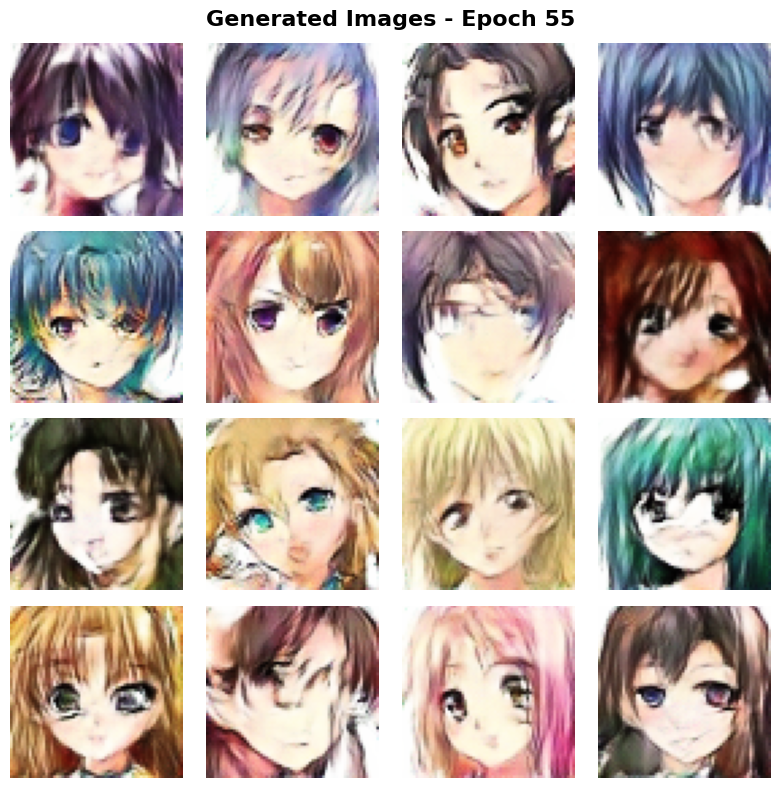

Epoch 55: Gen Loss = 1.1793, Disc Loss = 1.1333
--------------------------------------------------


Epoch 56/70: 993it [01:41,  9.81it/s, Gen Loss=0.9377, Disc Loss=1.1026, Train Disc=1]


Epoch 56: Gen Loss = 1.2003, Disc Loss = 1.1236
--------------------------------------------------


Epoch 57/70: 993it [01:41,  9.77it/s, Gen Loss=1.1245, Disc Loss=1.0666, Train Disc=1]


Epoch 57: Gen Loss = 1.2207, Disc Loss = 1.1114
--------------------------------------------------


Epoch 58/70: 993it [01:41,  9.80it/s, Gen Loss=1.4487, Disc Loss=1.2143, Train Disc=1]


Epoch 58: Gen Loss = 1.2441, Disc Loss = 1.0976
--------------------------------------------------


Epoch 59/70: 993it [01:41,  9.83it/s, Gen Loss=1.0889, Disc Loss=0.9778, Train Disc=1]


Epoch 59: Gen Loss = 1.2709, Disc Loss = 1.0899
--------------------------------------------------


Epoch 60/70: 993it [01:41,  9.77it/s, Gen Loss=1.3238, Disc Loss=1.1551, Train Disc=1]


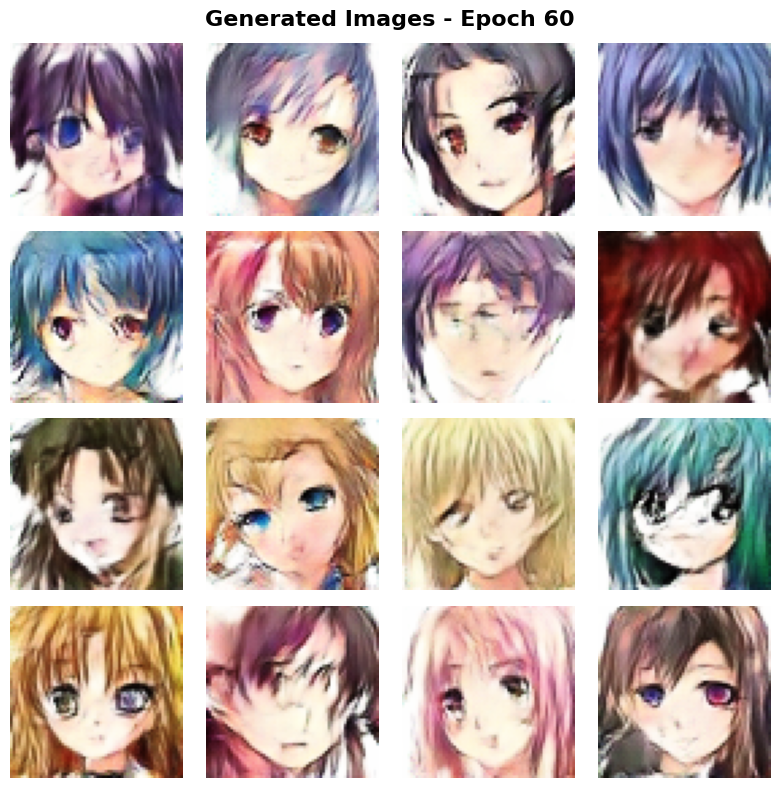

Checkpoint saved at epoch 60
Epoch 60: Gen Loss = 1.2974, Disc Loss = 1.0802
--------------------------------------------------


Epoch 61/70: 993it [01:40,  9.85it/s, Gen Loss=1.1180, Disc Loss=1.1563, Train Disc=1]


Epoch 61: Gen Loss = 1.3127, Disc Loss = 1.0656
--------------------------------------------------


Epoch 62/70: 993it [01:41,  9.80it/s, Gen Loss=1.3889, Disc Loss=1.0915, Train Disc=1]


Epoch 62: Gen Loss = 1.3374, Disc Loss = 1.0559
--------------------------------------------------


Epoch 63/70: 993it [01:41,  9.82it/s, Gen Loss=1.3028, Disc Loss=1.0499, Train Disc=1]


Epoch 63: Gen Loss = 1.3602, Disc Loss = 1.0532
--------------------------------------------------


Epoch 64/70: 993it [01:41,  9.80it/s, Gen Loss=1.4949, Disc Loss=0.8924, Train Disc=1]


Epoch 64: Gen Loss = 1.3756, Disc Loss = 1.0379
--------------------------------------------------


Epoch 65/70: 993it [01:40,  9.90it/s, Gen Loss=1.5303, Disc Loss=0.8738, Train Disc=1]


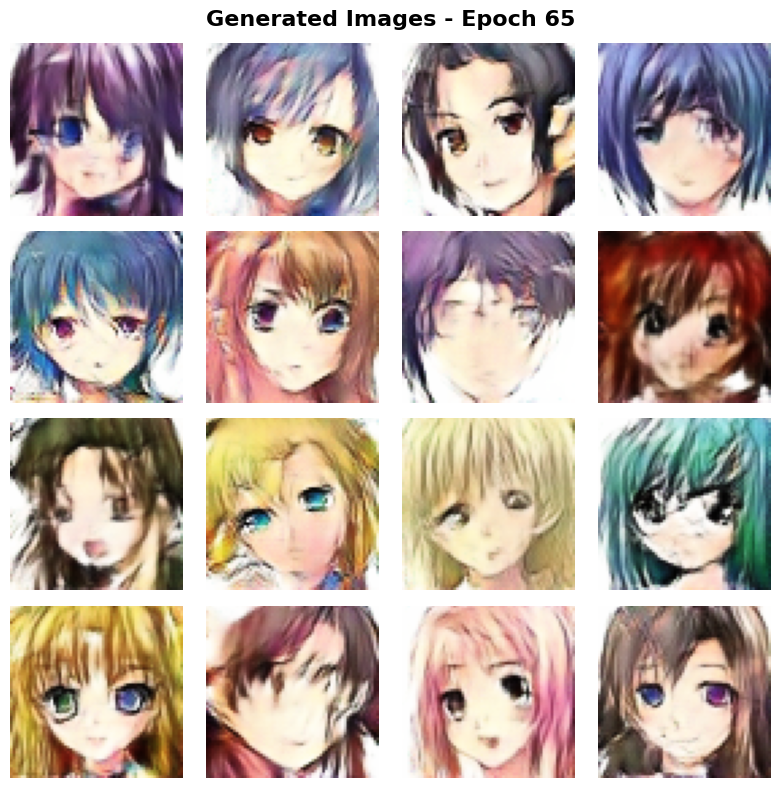

Epoch 65: Gen Loss = 1.4029, Disc Loss = 1.0270
--------------------------------------------------


Epoch 66/70: 993it [01:41,  9.82it/s, Gen Loss=1.2644, Disc Loss=1.1173, Train Disc=1]


Epoch 66: Gen Loss = 1.4313, Disc Loss = 1.0230
--------------------------------------------------


Epoch 67/70: 993it [01:41,  9.78it/s, Gen Loss=1.2807, Disc Loss=0.9661, Train Disc=1]


Epoch 67: Gen Loss = 1.4538, Disc Loss = 1.0147
--------------------------------------------------


Epoch 68/70: 993it [01:41,  9.77it/s, Gen Loss=1.3908, Disc Loss=0.8076, Train Disc=1]


Epoch 68: Gen Loss = 1.4620, Disc Loss = 1.0098
--------------------------------------------------


Epoch 69/70: 993it [01:41,  9.78it/s, Gen Loss=1.4208, Disc Loss=0.8134, Train Disc=1]


Epoch 69: Gen Loss = 1.4954, Disc Loss = 0.9998
--------------------------------------------------


Epoch 70/70: 993it [01:41,  9.80it/s, Gen Loss=1.7425, Disc Loss=0.9308, Train Disc=1]


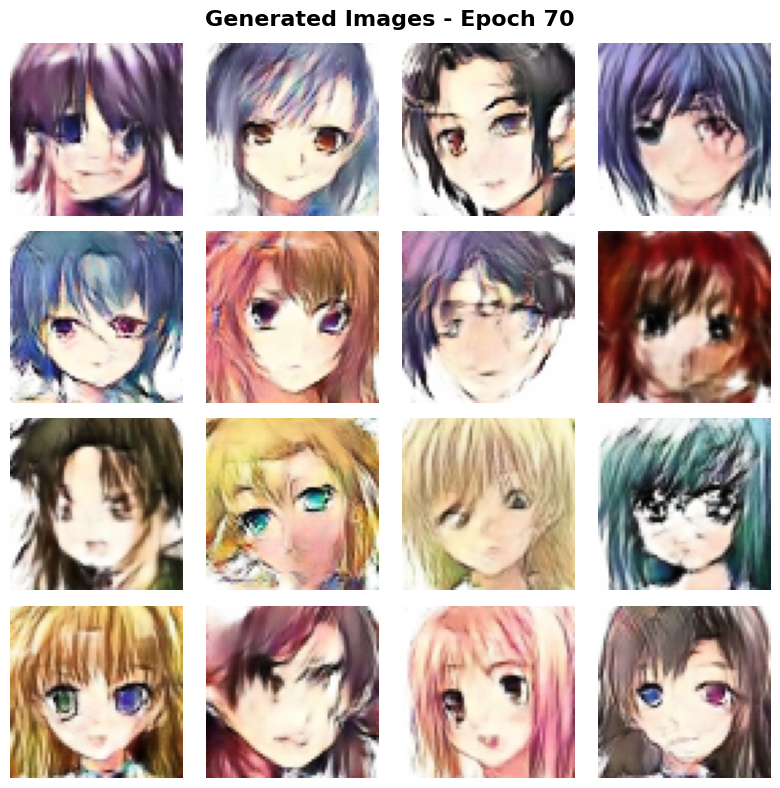

Checkpoint saved at epoch 70
Epoch 70: Gen Loss = 1.5041, Disc Loss = 0.9899
--------------------------------------------------
Training completed!


In [28]:
# Start training
print("Starting Anime Face GAN Training!")
print(f"Training with {dataset_size} images for {EPOCHS} epochs")
print("Grab some coffee ☕ - this might take a while!")

# gen_losses, disc_losses = train(train_dataset, EPOCHS)
gen_losses, disc_losses = train_improved(train_dataset, EPOCHS, BATCH_SIZE, NOISE_DIM)

print("Training completed!")

## Training Results Analysis

Let's analyze how our GAN performed during training by examining the loss curves and generating final samples.


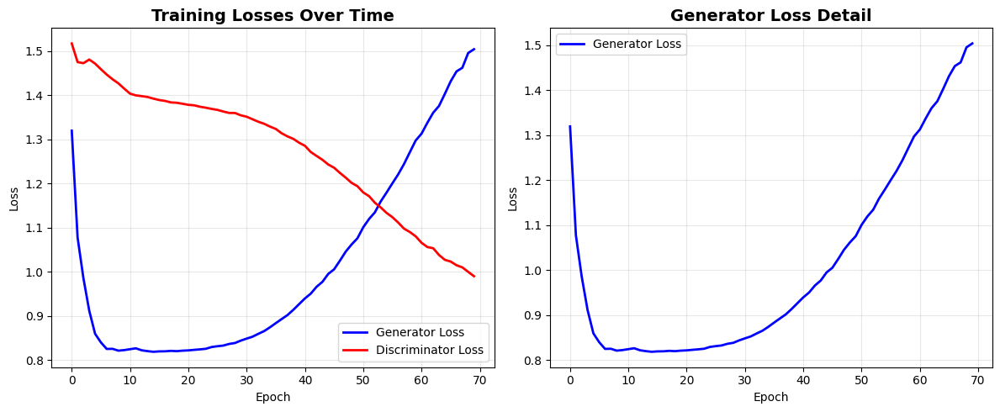

In [29]:
# Plot training losses
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(gen_losses, label='Generator Loss', color='blue', linewidth=2)
plt.plot(disc_losses, label='Discriminator Loss', color='red', linewidth=2)
plt.title('Training Losses Over Time', fontsize=14, fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(1, 2, 2)
plt.plot(gen_losses, label='Generator Loss', color='blue', linewidth=2)
plt.title('Generator Loss Detail', fontsize=14, fontweight='bold')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [30]:
# Print final statistics
print("Training Statistics:")
print(f"Final Generator Loss: {gen_losses[-1]:.4f}")
print(f"Final Discriminator Loss: {disc_losses[-1]:.4f}")
print(f"Lowest Generator Loss: {min(gen_losses):.4f} (Epoch {np.argmin(gen_losses) + 1})")


Training Statistics:
Final Generator Loss: 1.5041
Final Discriminator Loss: 0.9899
Lowest Generator Loss: 0.8187 (Epoch 15)


## Final Results: Generated Anime Faces

Let's generate a final batch of anime faces using our trained generator and compare them with real images from our dataset.


Generating final anime faces...


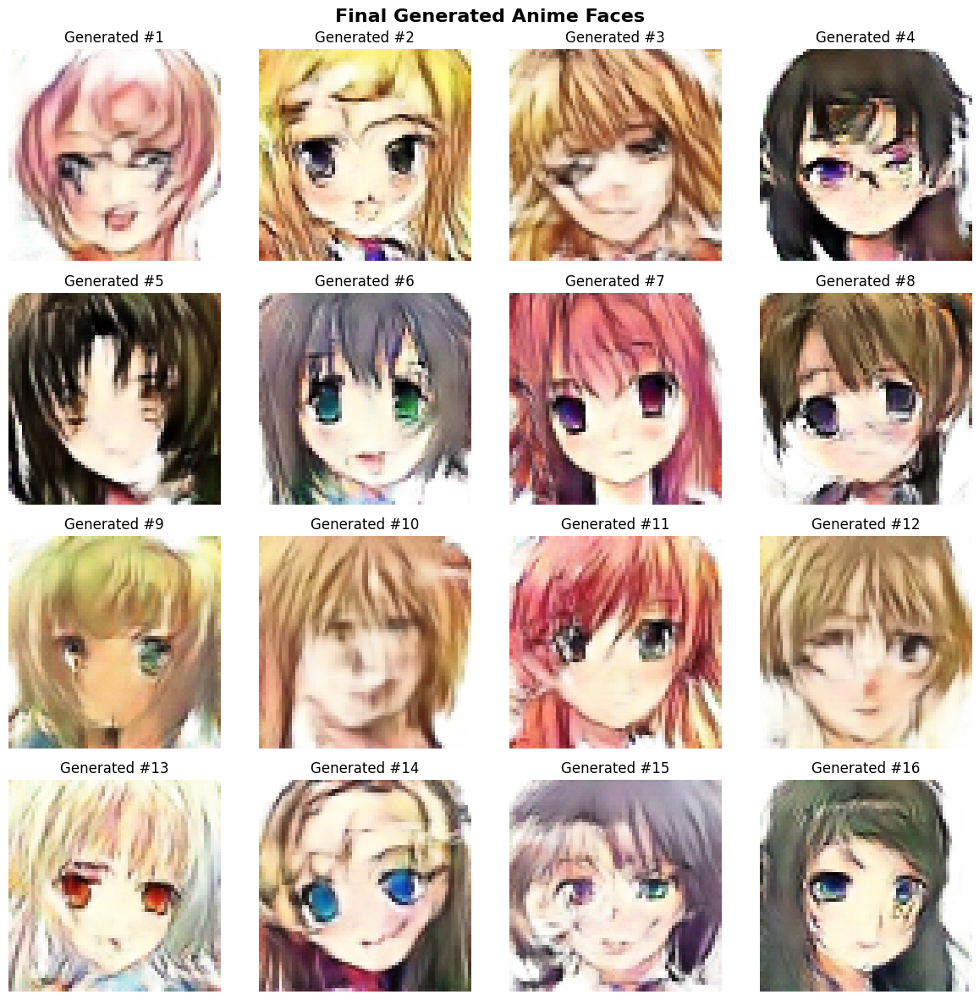

In [31]:
# Generate final images with the trained model
print("Generating final anime faces...")

# Create new random seeds for variety
final_seed = tf.random.normal([16, NOISE_DIM])
final_generated_images = generator(final_seed, training=False)

# Display final results
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
fig.suptitle('Final Generated Anime Faces', fontsize=16, fontweight='bold')

for i, ax in enumerate(axes.flat):
    img = (final_generated_images[i] + 1) / 2.0
    img = tf.clip_by_value(img, 0.0, 1.0)
    ax.imshow(img)
    ax.set_title(f'Generated #{i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

## Model Evaluation: Real vs Generated Comparison

Let's create a side-by-side comparison between real anime faces from our dataset and generated ones to evaluate the quality of our GAN.


In [32]:
def compare_real_vs_generated(dataset, generator, num_comparisons=8):
    """Compare real and generated images side by side"""
    # Get real images
    for real_batch in dataset.take(1):
        real_images = real_batch[:num_comparisons]
        break
    
    # Generate fake images
    noise = tf.random.normal([num_comparisons, NOISE_DIM])
    generated_images = generator(noise, training=False)
    
    # Create comparison plot
    fig, axes = plt.subplots(2, num_comparisons, figsize=(16, 4))
    fig.suptitle('Real vs Generated Anime Faces Comparison', fontsize=16, fontweight='bold')
    
    for i in range(num_comparisons):
        # Real images (top row)
        real_img = (real_images[i] + 1) / 2.0
        real_img = tf.clip_by_value(real_img, 0.0, 1.0)
        axes[0, i].imshow(real_img)
        axes[0, i].set_title('Real' if i == num_comparisons//2 else '')
        axes[0, i].axis('off')
        
        # Generated images (bottom row)
        gen_img = (generated_images[i] + 1) / 2.0
        gen_img = tf.clip_by_value(gen_img, 0.0, 1.0)
        axes[1, i].imshow(gen_img)
        axes[1, i].set_title('Generated' if i == num_comparisons//2 else '')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()

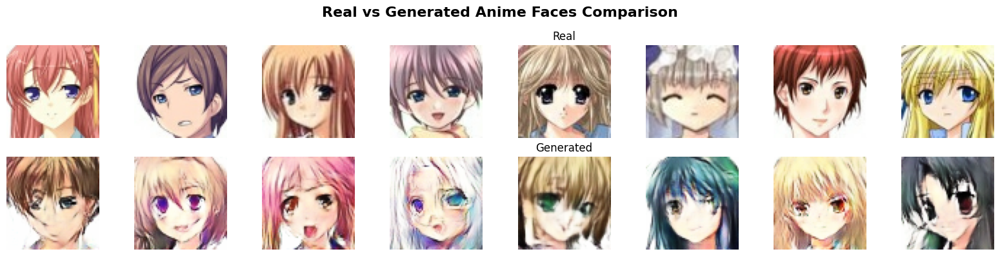

In [33]:
# Perform comparison
compare_real_vs_generated(train_dataset, generator)

## Save Model and Generate Additional Samples

Finally, let's save our trained generator model and create a larger collection of generated anime faces to showcase our results.


In [34]:
# Save the generator model
generator.save('anime_face_generator.h5')
print("Generator model saved as 'anime_face_generator.h5'")

Generator model saved as 'anime_face_generator.h5'


# Conclusion and Next Steps

### What We Accomplished:
- Successfully implemented a GAN for anime face generation
- Processed 63,632 anime face images
- Trained both Generator and Discriminator networks
- Generated realistic anime faces from random noise
- Visualized training progress and final results

### Key Observations:
1. **Training Stability**: Monitor loss curves to ensure balanced training
2. **Image Quality**: Generated faces show clear anime characteristics
3. **Diversity**: Model produces varied faces with different styles and features
4. **Training Time**: ~{EPOCHS} epochs provided good results

In [35]:
print(f'Final Generator Loss: {gen_losses[-1]:.4f}')
print(f'Final Discriminator Loss: {disc_losses[-1]:.4f}')
print(f'Training Dataset Size: {dataset_size:,} images')

Final Generator Loss: 1.5041
Final Discriminator Loss: 0.9899
Training Dataset Size: 63,552 images


### Potential Improvements:
1. **Higher Resolution**: Train with 128x128 or 256x256 images
2. **Progressive Growing**: Implement progressive GAN architecture
3. **Style Transfer**: Add conditional generation for specific anime styles
4. **Advanced Architectures**: Try StyleGAN or WGAN-GP
5. **Data Augmentation**: Add more sophisticated augmentation techniques

Generating a collection of anime faces...


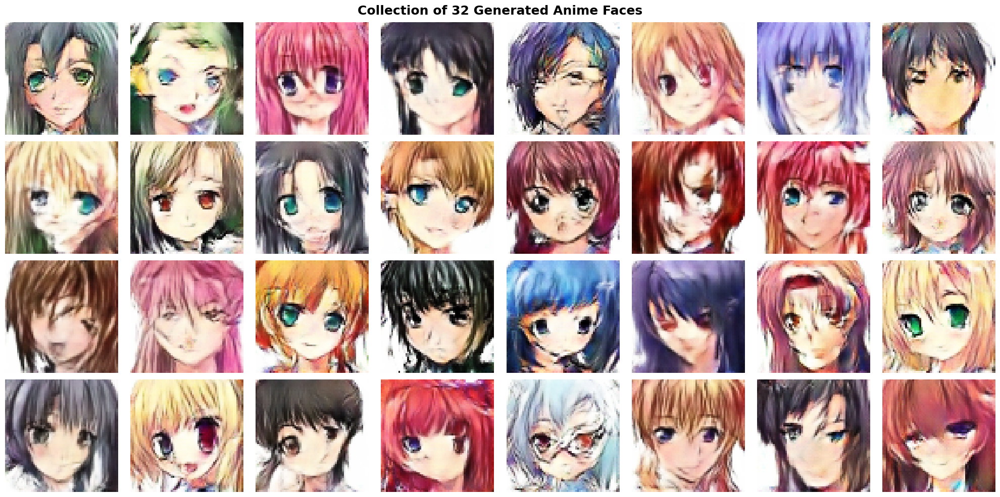

In [36]:
# Generate a large batch of samples
print("Generating a collection of anime faces...")

num_samples = 32
large_noise = tf.random.normal([num_samples, NOISE_DIM])
large_generated_batch = generator(large_noise, training=False)

# Display the large collection
fig, axes = plt.subplots(4, 8, figsize=(20, 10))
fig.suptitle(f'Collection of {num_samples} Generated Anime Faces', fontsize=18, fontweight='bold')

for i, ax in enumerate(axes.flat):
    if i < num_samples:
        img = (large_generated_batch[i] + 1) / 2.0
        img = tf.clip_by_value(img, 0.0, 1.0)
        ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()

## Additional Utility Functions

Here are some bonus utility functions we can use to further explore our trained GAN:

In [37]:
def interpolate_between_faces(generator, face1_noise, face2_noise, steps=10):
    """Create smooth interpolation between two generated faces"""
    interpolated_faces = []
    
    for i in range(steps):
        alpha = i / (steps - 1)
        interpolated_noise = (1 - alpha) * face1_noise + alpha * face2_noise
        face = generator(interpolated_noise, training=False)
        interpolated_faces.append(face[0])
    
    # Display interpolation
    fig, axes = plt.subplots(1, steps, figsize=(20, 2))
    fig.suptitle('Face Interpolation', fontsize=14, fontweight='bold')
    
    for i, ax in enumerate(axes):
        img = (interpolated_faces[i] + 1) / 2.0
        img = tf.clip_by_value(img, 0.0, 1.0)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(f'Step {i+1}')
    
    plt.tight_layout()
    plt.show()

In [38]:
def generate_face_grid(generator, rows=8, cols=8):
    """Generate a large grid of faces"""
    total_faces = rows * cols
    noise = tf.random.normal([total_faces, NOISE_DIM])
    faces = generator(noise, training=False)
    
    fig, axes = plt.subplots(rows, cols, figsize=(16, 16))
    fig.suptitle(f'{total_faces} Generated Anime Faces', fontsize=16, fontweight='bold')
    
    for i, ax in enumerate(axes.flat):
        img = (faces[i] + 1) / 2.0
        img = tf.clip_by_value(img, 0.0, 1.0)
        ax.imshow(img)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [39]:
def analyze_generated_diversity(generator, num_samples=100):
    """Analyze the diversity of generated samples"""
    noise = tf.random.normal([num_samples, NOISE_DIM])
    generated_faces = generator(noise, training=False)
    
    # Convert to numpy for analysis
    faces_np = generated_faces.numpy()
    faces_np = (faces_np + 1) / 2.0  # Denormalize
    
    # Calculate pixel statistics
    mean_pixel_values = np.mean(faces_np, axis=(1, 2, 3))
    std_pixel_values = np.std(faces_np, axis=(1, 2, 3))
    
    # Plot diversity metrics
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    axes[0].hist(mean_pixel_values, bins=20, alpha=0.7, color='blue', edgecolor='black')
    axes[0].set_title('Distribution of Mean Pixel Values')
    axes[0].set_xlabel('Mean Pixel Value')
    axes[0].set_ylabel('Frequency')
    
    axes[1].hist(std_pixel_values, bins=20, alpha=0.7, color='green', edgecolor='black')
    axes[1].set_title('Distribution of Pixel Standard Deviations')
    axes[1].set_xlabel('Pixel Standard Deviation')
    axes[1].set_ylabel('Frequency')
    
    plt.suptitle('Generated Samples Diversity Analysis', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    print(f"Diversity Analysis Results:")
    print(f"Mean pixel value range: {np.min(mean_pixel_values):.3f} - {np.max(mean_pixel_values):.3f}")
    print(f"Std pixel value range: {np.min(std_pixel_values):.3f} - {np.max(std_pixel_values):.3f}")
    print(f"Overall diversity score: {np.std(mean_pixel_values):.3f}")


Running utility functions...


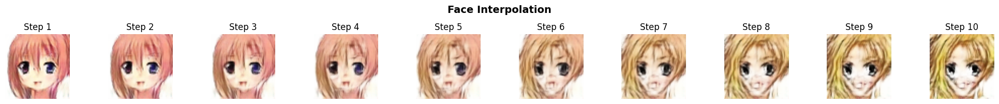

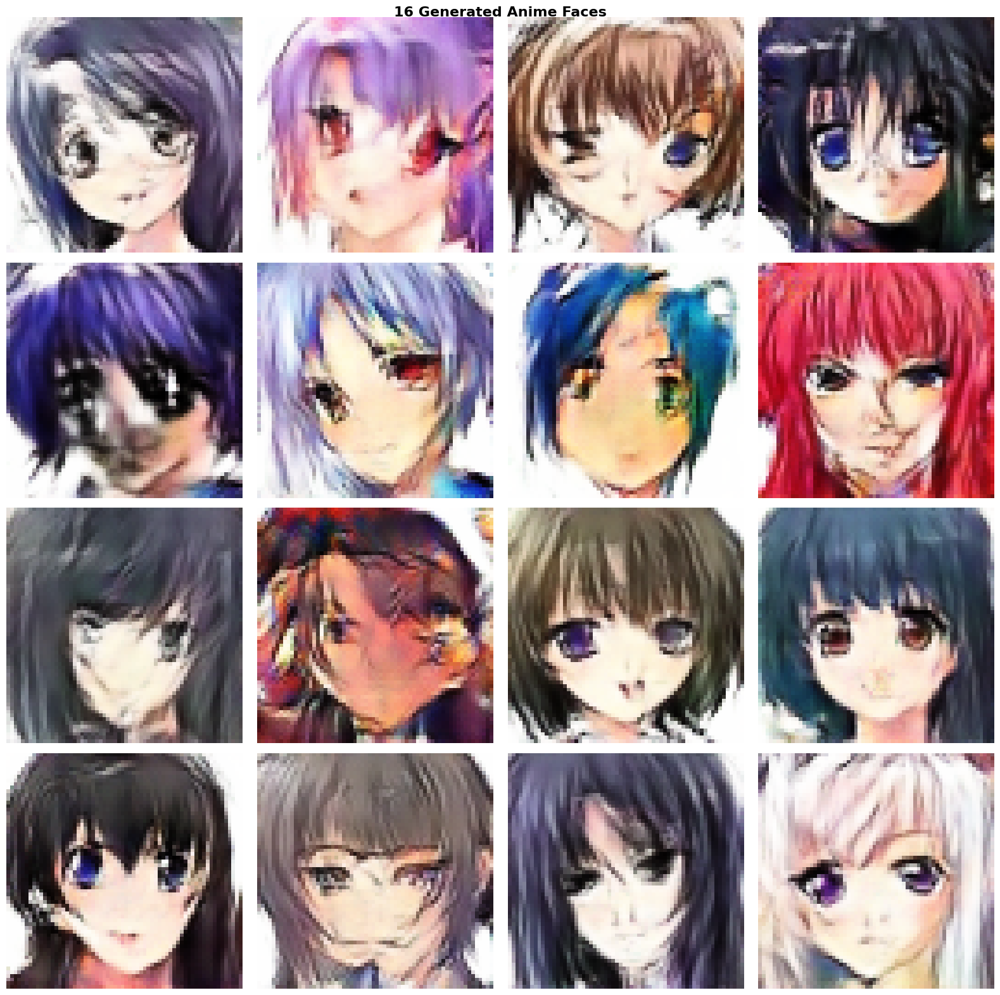

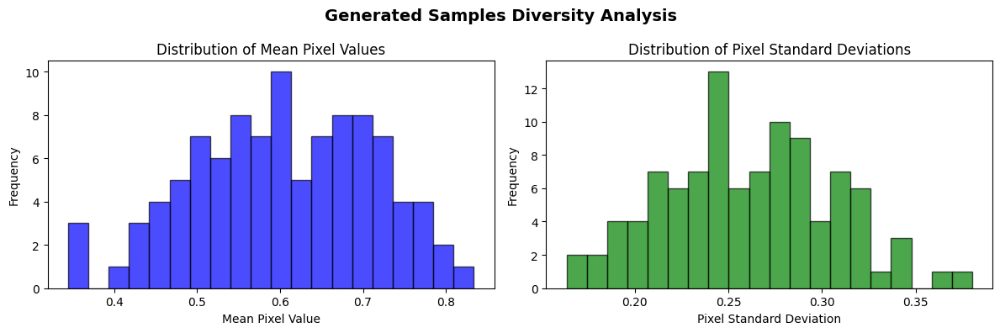

Diversity Analysis Results:
Mean pixel value range: 0.345 - 0.834
Std pixel value range: 0.164 - 0.380
Overall diversity score: 0.108


In [40]:
print("Running utility functions...")

# Create face interpolation
noise1 = tf.random.normal([1, NOISE_DIM])
noise2 = tf.random.normal([1, NOISE_DIM])
interpolate_between_faces(generator, noise1, noise2)

# Generate large grid
generate_face_grid(generator, rows=4, cols=4)

# Analyze diversity
analyze_generated_diversity(generator)